---
title: "Example Notebooks of DifferentialEquation.jl" \
author: "Naoya Ozaki" \
date: "03 December 2022" \
output: "ode_example"

---

# 1. Examples of Different ODE Solver in Julia
There are 1) `DifferentialEquations.jl` with `ParameterizedFunctions.jl`, 2) `DifferentialEquations.jl`, and 3) `Sundials.jl`.

┌ Warning: To maintain consistency with solution indexing, keyword argument vars will be removed in a future version. Please use keyword argument idxs instead.
│   caller = ip:0x0
└ @ Core :-1


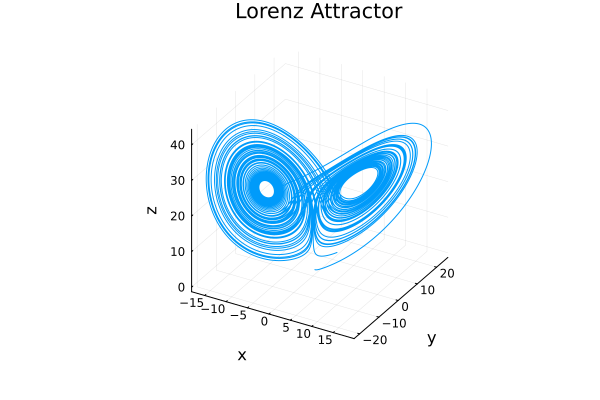

In [1]:
using ParameterizedFunctions, DifferentialEquations
using Plots

# 常微分方程式の定義
g = @ode_def Lorenz begin
    dx = p * (y - x)
    dy = x * (r - z) - y
    dz = x * y - b * z
end p r b

# 問題定義
u0 = [0.0; 1.01; 0.0]
tspan = (0.0, 100.0)
p = [10.0, 25.0, 7 / 3]
prob = ODEProblem(g, u0, tspan, p)

# 計算
sol = solve(prob, Tsit5(), reltol=1e-8, abstol=1e-8)

plot(sol, vars=(1, 2, 3), title="Lorenz Attractor",
        xlabel="x", ylabel="y", zlabel="z", label="")

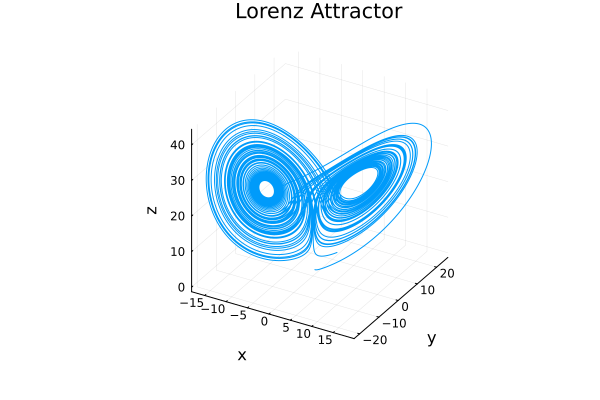

In [2]:
using ParameterizedFunctions, DifferentialEquations
using Plots

# 常微分方程式の定義
function lorenz!(dx,x,p,t)
    # dx/dt
    dx[1] = 10.0 * (x[2] - x[1])
    dx[2] = x[1] * (25.0 - x[3]) - x[2]
    dx[3] = x[1] * x[2] - (7 / 3) * x[3]
end

# 問題定義
x0 = [0.0; 1.01; 0.0]
tspan = (0.0, 100.0)
prob = ODEProblem(lorenz!, x0, tspan)

# 計算
sol = solve(prob, Tsit5(), reltol=1e-8, abstol=1e-8)

plot(sol, vars=(1, 2, 3), title="Lorenz Attractor",
    xlabel="x", ylabel="y", zlabel="z", label="")

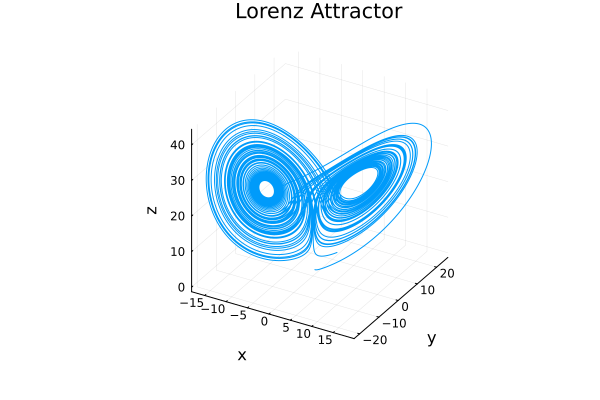

In [3]:
using Sundials
using Plots

function lorenz(du, u, p, t)
    du[1] = 10.0(u[2] - u[1])
    du[2] = u[1] * (25.0 - u[3]) - u[2]
    du[3] = u[1] * u[2] - (7 / 3) * u[3]
end
u0 = [0.0; 1.01; 0.0]
tspan = (0.0, 100.0)
prob = ODEProblem(lorenz, u0, tspan)
sol = solve(prob, Tsit5(), reltol=1e-8, abstol=1e-8)

plot(sol, vars=(1, 2, 3), title="Lorenz Attractor",
    xlabel="x", ylabel="y", zlabel="z", label="")

# 2. Trajectory Propagation

┌ Warning: To maintain consistency with solution indexing, keyword argument vars will be removed in a future version. Please use keyword argument idxs instead.
│   caller = ip:0x0
└ @ Core :-1


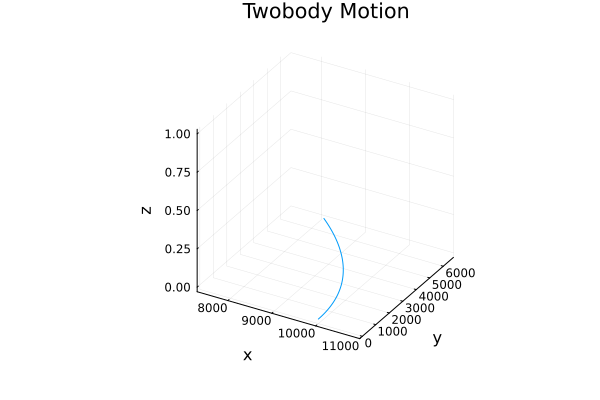

In [1]:
using DifferentialEquations
using Plots
using LinearAlgebra
using NBodyPropagator

ssd = SolarSystemDynamics()

# Definition of Ordinary Differential Equation
function twobody!(dxdt, x, p, t)
    # dx/dt
    r = norm(x[1:3])
    dxdt[1:3] = x[4:6]
    dxdt[4:6] = -ssd.GM["EARTH"] * x[1:3] / (r^3)
end

# Propagator Setting
x0 = [10000; 0; 0; 0; 7; 0]
tspan = (0.0, 1000.0)
prob = ODEProblem(twobody!, x0, tspan)

# Solve
sol = solve(prob, Tsit5(), reltol=1e-8, abstol=1e-8)

plot(sol, vars=(1, 2, 3), title="Twobody Motion",
    xlabel="x", ylabel="y", zlabel="z", label="")